# Get nearest images from the training set for a given query image using Locality Sensitive Hashing (Near-duplicate Image Search)

## Case-based reasoning explanations

References:
* https://keras.io/examples/vision/near_dup_search/ (Heavily adapted from)
* https://towardsdatascience.com/finding-similar-images-using-deep-learning-and-locality-sensitive-hashing-9528afee02f5
* https://towardsdatascience.com/fast-near-duplicate-image-search-using-locality-sensitive-hashing-d4c16058efcb

In [ ]:
# Import necessary libraries
import matplotlib.pyplot as plt
import numpy as np
import time

import tensorflow as tf
import tensorflow_datasets as tfds

!pip install --upgrade tensorflow_hub
import tensorflow_hub as hub

In [ ]:
# Load data
train_ds, validation_ds = tfds.load(
    "tf_flowers", split=["train[:85%]", "train[85%:]"], as_supervised=True
)

IMAGE_SIZE = (224, 224)
n_train, n_valid = 2000, 250


# The following arrays will be used for the step after model is trained
# for embedding & finding closest cases
train_images, valid_images = [], []
train_labels, valid_labels = [], []
# 
for (image, label) in train_ds.take(n_train):
    image = tf.image.resize(image, IMAGE_SIZE)
    train_images.append(image.numpy())
    train_labels.append(label.numpy())

train_images = np.array(train_images)
train_labels = np.array(train_labels)

for (image, label) in validation_ds.take(n_valid):
    image = tf.image.resize(image, IMAGE_SIZE)
    valid_images.append(image.numpy())
    valid_labels.append(label.numpy())

valid_images = np.array(valid_images)
valid_labels = np.array(valid_labels)

local data directory. If you'd instead prefer to read directly from our public
GCS bucket (recommended if you're running on GCP), you can instead pass
`try_gcs=True` to `tfds.load` or set `data_dir=gs://tfds-data/datasets`.



Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]


Dataset tf_flowers downloaded and prepared to /root/tensorflow_datasets/tf_flowers/3.0.1. Subsequent calls will reuse this data.


In [ ]:
print(train_images[:5].shape, valid_images[:5].shape)
print(train_labels[:5], valid_labels[:5])

(5, 224, 224, 3) (5, 224, 224, 3)
[2 3 3 4 3] [1 0 0 2 2]


In [ ]:
train_images[: 5].shape

(5, 224, 224, 3)

In [ ]:
class_names = {
    0: 'dandelion',
    1: 'daisy',
    2: 'tulips',
    3: 'sunflowers',
    4: 'roses'
}

In [ ]:
# Load SavedModel from Google Drive
# Model was trained using Transfer Learning using a ResNetv2 model pre-trained on ImageNet
!cp /content/drive/MyDrive/xai/ir2-flowers-model.zip pre-trained-model.zip
!unzip pre-trained-model.zip

Archive:  pre-trained-model.zip
   creating: saved_model/ir2-flowers-model/
  inflating: saved_model/ir2-flowers-model/saved_model.pb  
   creating: saved_model/ir2-flowers-model/variables/
  inflating: saved_model/ir2-flowers-model/variables/variables.data-00000-of-00001  
  inflating: saved_model/ir2-flowers-model/variables/variables.index  
   creating: saved_model/ir2-flowers-model/assets/
  inflating: saved_model/ir2-flowers-model/keras_metadata.pb  


In [ ]:
# Load Saved Model
saved_model_path = '/content/saved_model/ir2-flowers-model'
model = tf.keras.models.load_model(saved_model_path)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

<class 'PIL.JpegImagePlugin.JpegImageFile'>


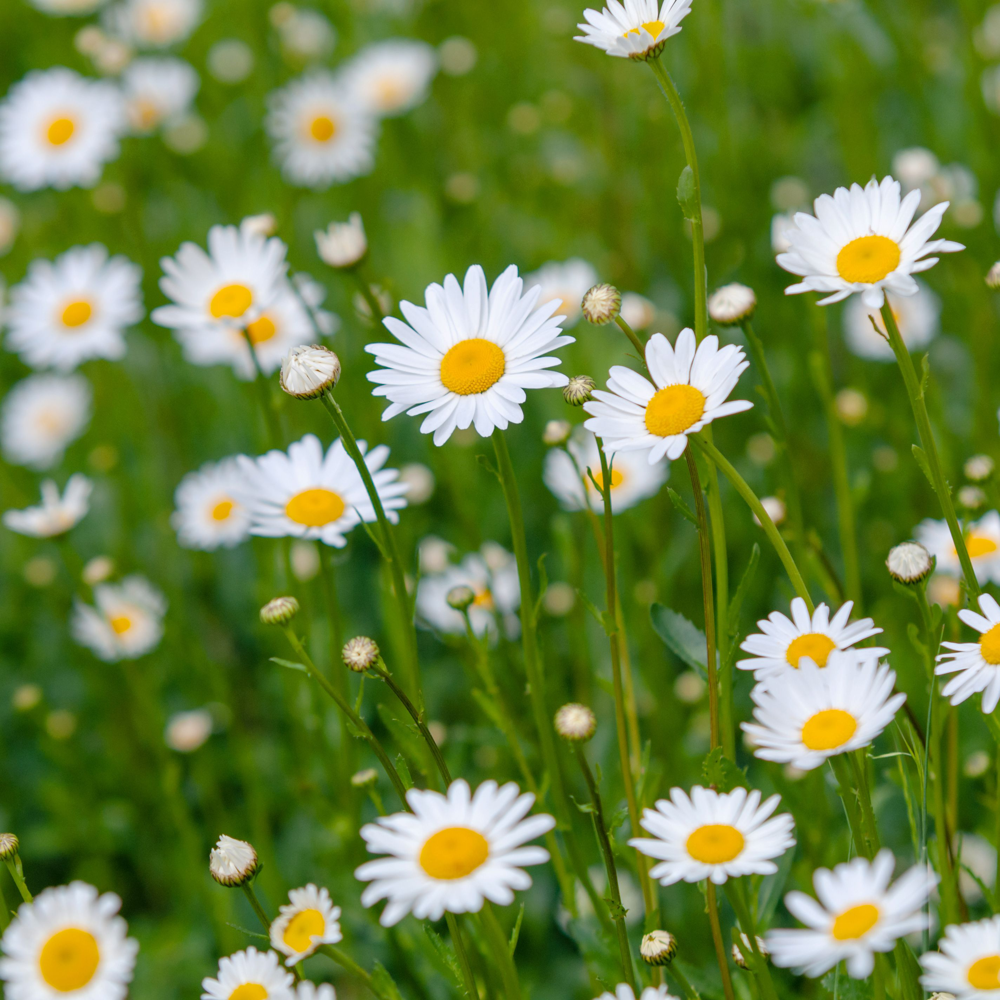

In [ ]:
from PIL import Image
image_uri = '/content/drive/MyDrive/xai/daisy.jpeg'

# this is the original "cat dog" image used in the Grad-CAM paper
# check the image with Pillow
im = Image.open(image_uri)
print(type(im))
display(im)

In [ ]:
# check the input format
print(model.input_shape)
dims = model.input_shape[1:3] # -> (height, width)
print(dims)

(None, 224, 224, 3)
(224, 224)


<PIL.Image.Image image mode=RGB size=224x224 at 0x7F01C174EC10>


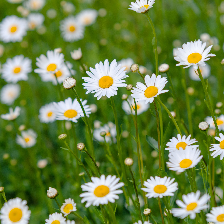

In [ ]:
im = tf.keras.preprocessing.image.load_img(image_uri, target_size=dims) # -> PIL image
print(im)
display(im)

In [ ]:
doc = tf.keras.preprocessing.image.img_to_array(im) # -> numpy array
print(type(doc), doc.shape)

<class 'numpy.ndarray'> (224, 224, 3)


In [ ]:
doc = np.expand_dims(doc, axis=0)
print(type(doc), doc.shape)

<class 'numpy.ndarray'> (1, 224, 224, 3)


In [ ]:
predictions = model.predict(doc / 255.0)
predicted_label_idx = np.argmax(predictions)
predicted_class = class_names[predicted_label_idx]
print(f"Model predicted {predicted_class}. Following are the prediction probabilities for each class:\n{predictions}")

Model predicted daisy. Following are the prediction probabilities for each class:
[[1.90619612e-03 9.89314437e-01 1.86002377e-04 8.58334452e-03
  1.00359275e-05]]


In [ ]:
INPUT_SIZE = 224

# Define Embedding layer using this pre-trained model
embedding_model = tf.keras.Sequential(
    [
        tf.keras.layers.Input((INPUT_SIZE, INPUT_SIZE, 3)),
        tf.keras.layers.Rescaling(scale=1.0 / 255),
        hub.KerasLayer(saved_model_path),
        tf.keras.layers.Normalization(mean=0, variance=1),
    ],
    name="embedding_model",
)

embedding_model.summary()

Model: "embedding_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 keras_layer (KerasLayer)    (None, 5)                 54344421  
                                                                 
 normalization (Normalizatio  (None, 5)                0         
 n)                                                              
                                                                 
Total params: 54,344,421
Trainable params: 0
Non-trainable params: 54,344,421
_________________________________________________________________


In [ ]:
# LSH
def hash_func(embedding, random_vectors):
    embedding = np.array(embedding)

    # Random projection.
    bools = np.dot(embedding, random_vectors) > 0
    return [bool2int(bool_vec) for bool_vec in bools]


def bool2int(x):
    y = 0
    for i, j in enumerate(x):
        if j:
            y += 1 << i
    return y

class Table:
    def __init__(self, hash_size, dim):
        self.table = {}
        self.hash_size = hash_size
        self.random_vectors = np.random.randn(hash_size, dim).T

    def add(self, id, vectors, label):
        # Create a unique indentifier.
        entry = {"id_label": str(id) + "_" + str(label)}

        # Compute the hash values.
        hashes = hash_func(vectors, self.random_vectors)

        # Add the hash values to the current table.
        for h in hashes:
            if h in self.table:
                self.table[h].append(entry)
            else:
                self.table[h] = [entry]

    def query(self, vectors):
        # Compute hash value for the query vector.
        hashes = hash_func(vectors, self.random_vectors)
        results = []

        # Loop over the query hashes and determine if they exist in
        # the current table.
        for h in hashes:
            if h in self.table:
                results.extend(self.table[h])
        return results

class LSH:
    def __init__(self, hash_size, dim, num_tables):
        self.num_tables = num_tables
        self.tables = []
        for i in range(self.num_tables):
            self.tables.append(Table(hash_size, dim))

    def add(self, id, vectors, label):
        for table in self.tables:
            table.add(id, vectors, label)

    def query(self, vectors):
        results = []
        for table in self.tables:
            results.extend(table.query(vectors))
        return results


class BuildLSHTable:
    def __init__(
        self,
        prediction_model,
        concrete_function=False,
        hash_size=8,
        dim=5,
        num_tables=10,
    ):
        self.hash_size = hash_size
        self.dim = dim
        self.num_tables = num_tables
        self.lsh = LSH(self.hash_size, self.dim, self.num_tables)

        self.prediction_model = prediction_model
        self.concrete_function = concrete_function

    def train(self, training_files):
        for id, training_file in enumerate(training_files):
            # Unpack the data.
            image, label = training_file
            if len(image.shape) < 4:
                image = image[None, ...]

            # Compute embeddings and update the LSH tables.
            # More on `self.concrete_function()` later.
            if self.concrete_function:
                features = self.prediction_model(tf.constant(image))[
                    "normalization"
                ].numpy()
            else:
                features = self.prediction_model.predict(image)
            self.lsh.add(id, features, label)

    def query(self, image, verbose=True):
        # Compute the embeddings of the query image and fetch the results.
        if len(image.shape) < 4:
            image = image[None, ...]

        if self.concrete_function:
            features = self.prediction_model(tf.constant(image))[
                "normalization"
            ].numpy()
        else:
            features = self.prediction_model.predict(image)

        results = self.lsh.query(features)
        if verbose:
            print("Matches:", len(results))

        # Calculate Jaccard index to quantify the similarity.
        counts = {}
        for r in results:
            if r["id_label"] in counts:
                counts[r["id_label"]] += 1
            else:
                counts[r["id_label"]] = 1
        for k in counts:
            counts[k] = float(counts[k]) / self.dim
        return counts

In [ ]:
training_files = zip(train_images, train_labels)
lsh_builder = BuildLSHTable(embedding_model)
lsh_builder.train(training_files)

In [ ]:
def plot_images(images, labels):
    plt.figure(figsize=(20, 10))
    columns = 5
    for (i, image) in enumerate(images):
        ax = plt.subplot(len(images) / columns + 1, columns, i + 1)
        if i == 0:
            ax.set_title("Query Image\n" + "Label: {}".format(labels[i]))
        else:
            ax.set_title("Similar Image # " + str(i) + "\nLabel: {}".format(labels[i]))
        plt.imshow(image.astype("int"))
        plt.axis("off")


def visualize_lsh(lsh_class, query_img, predicted_idx):
    # idx = np.random.choice(len(valid_images))
    image = np.asarray(query_img)
    label = predicted_label_idx
    results = lsh_class.query(image)

    candidates = []
    labels = []
    overlaps = []

    for idx, r in enumerate(sorted(results, key=results.get, reverse=True)):
        if idx == 4:
            break
        image_id, label = r.split("_")[0], r.split("_")[1]
        candidates.append(train_images[int(image_id)])
        labels.append(label)
        overlaps.append(results[r])

    candidates.insert(0, image)
    labels.insert(0, label)

    plot_images(candidates, labels)

Matches: 2871


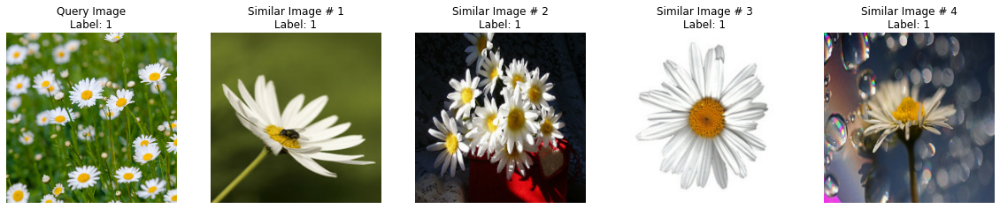

In [ ]:
visualize_lsh(lsh_builder, im, predicted_label_idx)